<>:31: SyntaxWarning:

invalid escape sequence '\d'

<>:31: SyntaxWarning:

invalid escape sequence '\d'

/tmp/ipython-input-439620112.py:31: SyntaxWarning:

invalid escape sequence '\d'

/tmp/ipython-input-439620112.py:27: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



Dataset Shape: (6827, 11)

Columns: ['Show_Id', 'Category', 'Title', 'Director', 'Cast', 'Country', 'Release_Date', 'Rating', 'Duration', 'Type', 'Description']

Missing Values:
 Show_Id         1150
Category        1521
Title           1768
Director        2036
Cast            2332
Country         2742
Release_Date    3377
Rating          4080
Duration        4907
Type            5673
Description     6360
dtype: int64

Data Types:
 Show_Id         object
Category        object
Title           object
Director        object
Cast            object
Country         object
Release_Date    object
Rating          object
Duration        object
Type            object
Description     object
dtype: object


/tmp/ipython-input-439620112.py:42: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




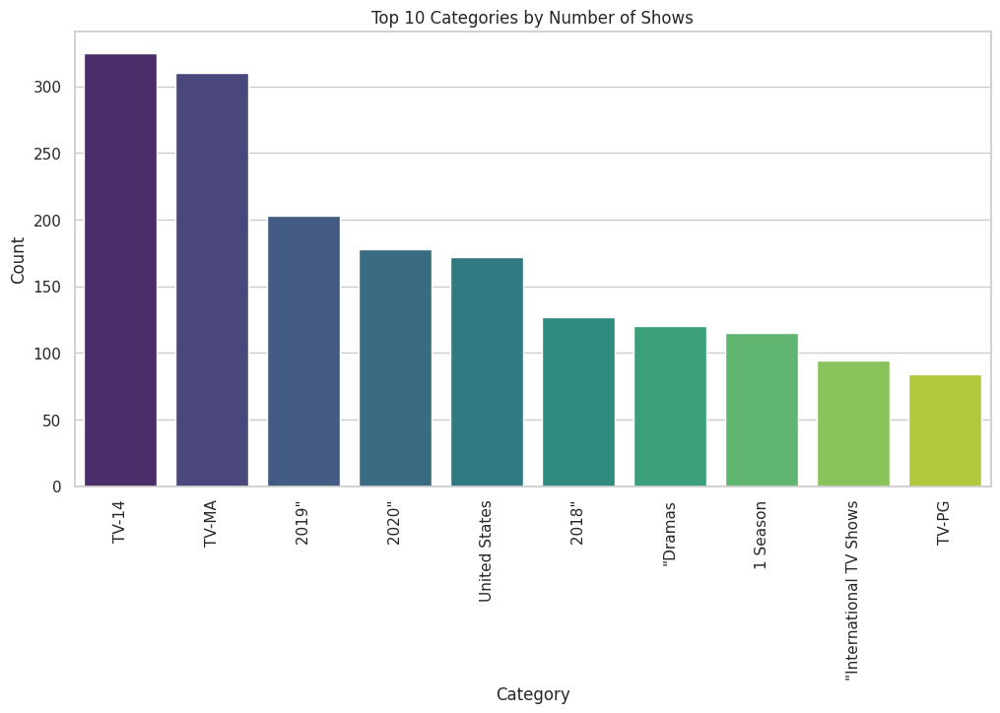

/tmp/ipython-input-439620112.py:52: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




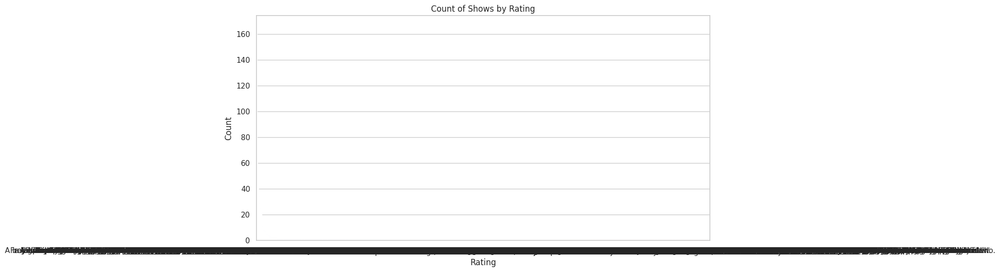

/tmp/ipython-input-439620112.py:62: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




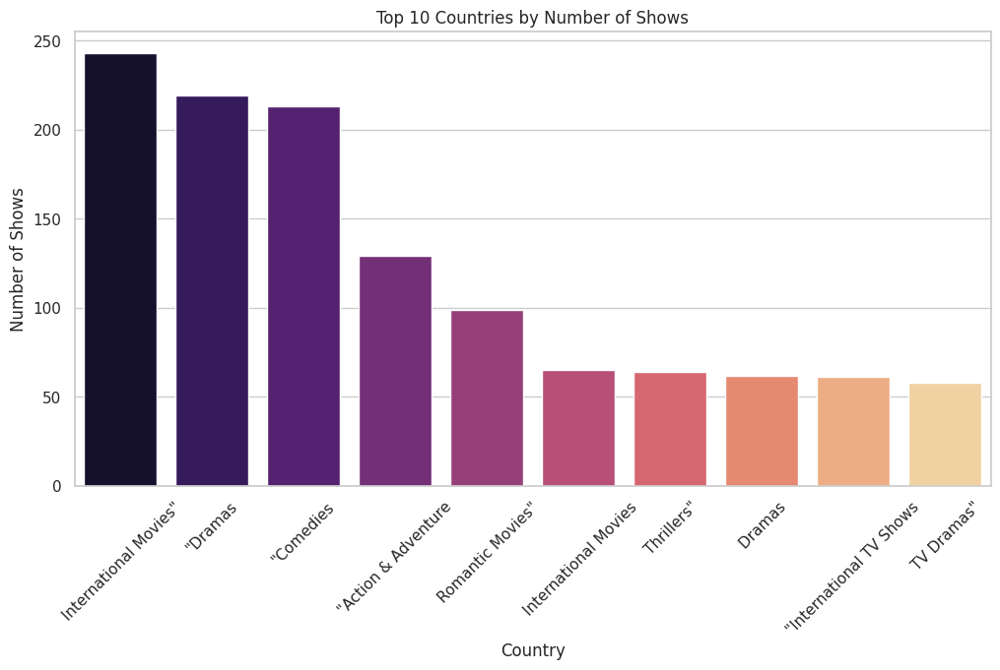

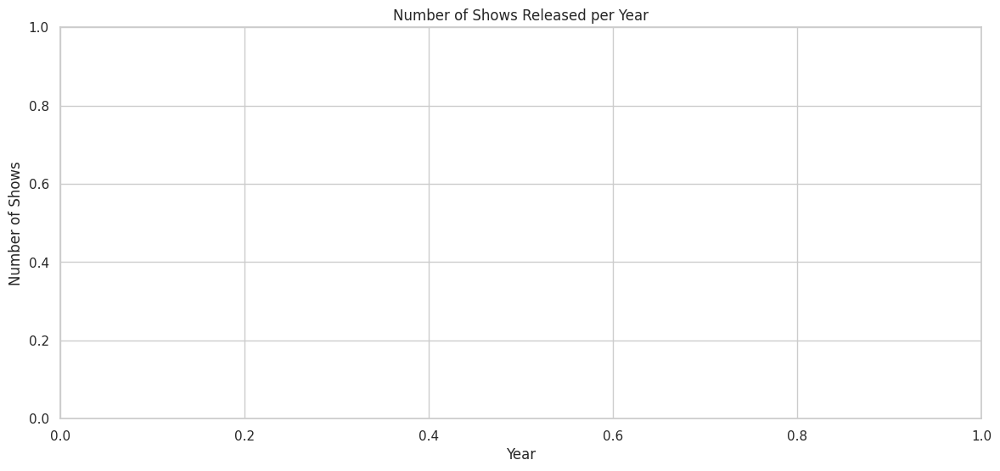

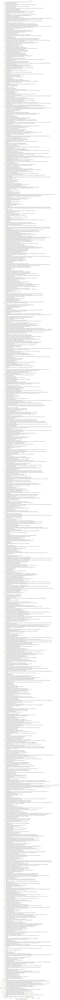

/tmp/ipython-input-439620112.py:93: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




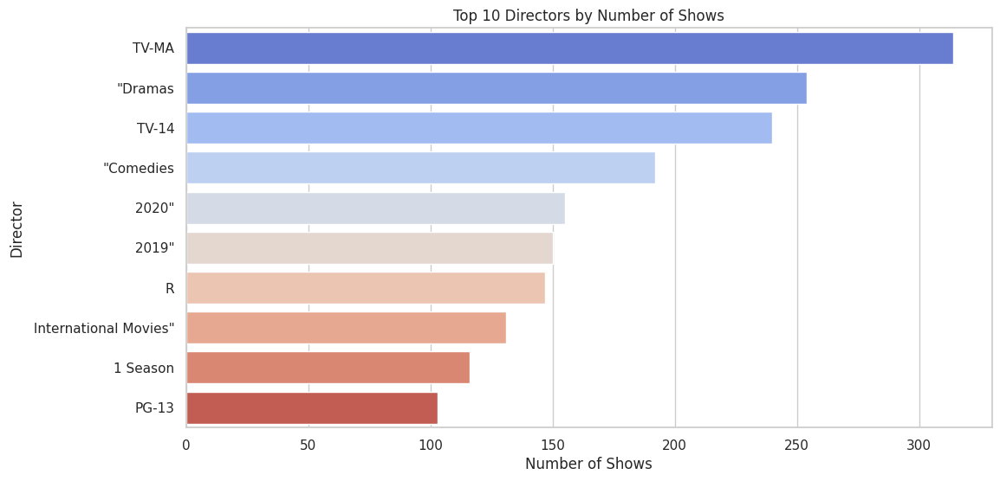


Top 5 Shows in Each Category:
Brazil: ['"August 14', '"November 2', '"February 15', '"February 26', '"November 22']
"Dramas: [' International Movies"', ' International Movies"', ' International Movies"', ' International Movies"', ' Independent Movies"']
 2018": ['R', 'R', 'TV-MA', 'R', 'TV-MA']
 2017": ['PG-13', 'TV-PG', 'PG-13', 'TV-MA', 'TV-PG']
 Jack Gilpin": ['United States']
"July 1: [' 2017"', ' 2017"', ' 2020"', ' 2017"', ' 2019"']
TV-MA: ['95 min', '143 min', '125 min', '90 min', '1 Season']
"After one of his high school students attacks him: [' dedicated teacher Trevor Garfield grows weary of the gang warfare in the New York City school system and moves to California to teach there']
 2019": ['TV-14', 'TV-MA', 'TV-14', 'TV-MA', 'PG-13']
103 min: ['"Dramas', '"Horror Movies', '"Dramas', '"Action & Adventure', '"Dramas']
 2: ['215-kilometer charity run across Thailand in 2017."']
91 min: ['"Independent Movies', '"Children & Family Movies', '"Action & Adventure', '"Dramas', '"Ho

In [71]:
# 1. Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")
%matplotlib inline

# 2. Load Dataset safely
df = pd.read_csv("/content/Netflix_Dataset.csv", on_bad_lines='skip', quoting=3)

# 3. Basic Info & Overview
print("Dataset Shape:", df.shape)
print("\nColumns:", df.columns.tolist())
print("\nMissing Values:\n", df.isnull().sum())
print("\nData Types:\n", df.dtypes)

# 4. Data Cleaning

# 4.1 Normalize column names
df.columns = df.columns.str.strip().str.lower().str.replace(' ', '_')

# 4.2 Drop duplicates
df.drop_duplicates(inplace=True)

# 4.3 Convert release_date to datetime
if 'release_date' in df.columns:
    df['release_date'] = pd.to_datetime(df['release_date'], errors='coerce')

# 4.4 Clean duration: extract numeric part
if 'duration' in df.columns:
    df['duration_clean'] = df['duration'].str.extract('(\d+)').astype(float)

# 4.5 Drop rows with missing critical values
df.dropna(subset=['show_id', 'title'], inplace=True)

# 5. Exploratory Data Analysis (EDA)

# 5.1 Top Categories
if 'category' in df.columns:
    top_categories = df['category'].value_counts().head(10)
    plt.figure(figsize=(12,6))
    sns.barplot(x=top_categories.index, y=top_categories.values, palette="viridis")
    plt.title("Top 10 Categories by Number of Shows")
    plt.xlabel("Category")
    plt.ylabel("Count")
    plt.xticks(rotation=90)
    plt.show()

# 5.2 Ratings distribution
if 'rating' in df.columns:
    plt.figure(figsize=(12,6))
    sns.countplot(data=df, x='rating', order=df['rating'].value_counts().index, palette="coolwarm")
    plt.title("Count of Shows by Rating")
    plt.xlabel("Rating")
    plt.ylabel("Count")
    plt.show()

# 5.3 Top Countries
if 'country' in df.columns:
    top_countries = df['country'].value_counts().head(10)
    plt.figure(figsize=(12,6))
    sns.barplot(x=top_countries.index, y=top_countries.values, palette="magma")
    plt.title("Top 10 Countries by Number of Shows")
    plt.xlabel("Country")
    plt.ylabel("Number of Shows")
    plt.xticks(rotation=45)
    plt.show()

# 5.4 Releases over time
if 'release_date' in df.columns:
    df['release_year'] = df['release_date'].dt.year
    release_counts = df['release_year'].value_counts().sort_index()
    plt.figure(figsize=(14,6))
    sns.lineplot(x=release_counts.index, y=release_counts.values, marker='o')
    plt.title("Number of Shows Released per Year")
    plt.xlabel("Year")
    plt.ylabel("Number of Shows")
    plt.show()

# 5.5 Duration Distribution by Type
if 'duration_clean' in df.columns and 'type' in df.columns:
    plt.figure(figsize=(12,6))
    sns.histplot(data=df, x='duration_clean', hue='type', bins=30, kde=True, palette="Set2")
    plt.title("Distribution of Duration by Type (Movie / TV Show)")
    plt.xlabel("Duration (Minutes / Seasons)")
    plt.ylabel("Count")
    plt.show()

# 5.6 Top Directors
if 'director' in df.columns:
    top_directors = df['director'].value_counts().head(10)
    plt.figure(figsize=(12,6))
    sns.barplot(x=top_directors.values, y=top_directors.index, palette="coolwarm")
    plt.title("Top 10 Directors by Number of Shows")
    plt.xlabel("Number of Shows")
    plt.ylabel("Director")
    plt.show()

# 5.7 Most Popular Shows by Category
if 'category' in df.columns and 'title' in df.columns:
    print("\nTop 5 Shows in Each Category:")
    for cat in df['category'].unique():
        top_shows = df[df['category']==cat]['title'].head(5).tolist()
        print(f"{cat}: {top_shows}")

# 6. Summary Insights
print("\nTop Categories:\n", df['category'].value_counts().head())
print("\nTop Countries:\n", df['country'].value_counts().head())
print("\nAverage Duration (all shows):", df['duration_clean'].mean())

# 7. Save Cleaned Dataset
df.to_csv("/content/Netflix_Cleaned.csv", index=False)
print("\nCleaned dataset saved as Netflix_Cleaned.csv")
